# Project One

## Introduction

>The 2020 United States election was unique as there was new factors that could have influenced the outcome of the election in addition to traditional ones. COVID-19 during this time was a global health crisis and shaped many platforms of politicians as it urgently needed addressing. Traditional factors such as demographics and economic issues were affected by the pandemic significantly. The height of COVID saw many organized social movements take place and possibly influence voting for minorities. Additionally, the pandemic saw a sharp slow down in economic activity due to lockdowns and the US government decreasing interest rates to counter the negative GDP growth. The combination of influence of COVID-19, social movements, and the pandemic recession shaped the platforms of Trump and Biden and consequently, the expectations of voters. Voters candidate preferences were influenced by these covariates and thus the outcome of the election. 

>This analysis seeks to quantify and assess the influence of COVID when compared to traditional election factors such as demographic data and economic elements on the 2020 United States Election. The data covers all US counties and includes the 2020 and 2016 election. The source of this data is from Kaggle.com under the name "Election, COVID, and Demographic Data by County" by Ethan Schacht. This data and its analysis is important due to better understand the effect of extraneous factors on elections and their influence on voters. The data included how diverse counties are by the total percentage non-white, COVID as the amount of deaths per 10000, and averge income per county. The analysis revealed a strong positive correlation between diversity, covid death rate, education, and income with the percentage of a county voting for Joe Biden. The opposite is true for Trump voters where the covariates have a negative correlation with counties voting for Trump. The results of the analysis revealed strong associations for all covariates with the outcome, percentage of a county voting for a particular candidate. Using API web scraping to add additional covariates, such as education, to the data and establish a more accurate model for multivariable analysis and machine learning. After running simple regression analyses, education has a strong positive relationship with voting for Joe Biden while the opposite is true for Trump. An additional dataset was added to include median age by state and is analyzed for age differences in voting outcome. Extending the analysis to multivariable regression resulted in quantifying the relationship even further, where it revealed that COVID was not a statistical significant contributor to the voting outcome of a county for Trump or Biden. Usage of a regression tree was beneficial to analyze the relationship between the covariates in determination of voting outcome. Race was determined to be the most significant factor, specifically the proportion of a county being Asian, and the composition with other races before accounting for other traditional factors like income and education. The machine learning analysis, like the multivariable regression, accounted for COVID death rate and deemed it insigificant to the outcome and was not included on the tree. Relevant literature identifies a relationship between COVID and election outcome however De Lellis, Ruiz Marin, and Porfiri supports the notion that counties with less COVID had a higher voting margin for Biden and that if COVID case count was reduced by 20%, the reduction would be enough to allow Trump to be reelected (De Lellis et al., 2021). This study explains how prevalence of COVID affected the propensity to vote for Biden by using county data and entropy based probability. Baccini et al. additionally have used county-level data for COVID cases and deaths but also policies like shutdowns and masking policies with multivariate regression to show that Trump would have been reelected if COVID cases were five percent lower (Baccini et al., 2021). These previous literature explain that COVID had a great effect on the 2020 election and that changes in the severity of COVID would have altered the election. This paper aims to add to the existing literature by using multiple regression and machine learning to quantify the relationship between COVID and the election to a greater degree. It can be utilized to study how shocks affect electoral outcomes and subsequently prepare proper responses to shocks to both the economy and politics in the future.

> Link to interactive maps for section 2.2: 

>https://drive.google.com/file/d/1ocYVb_vLPXHVUvrGnNVtVQLLVZf1bSRk/view?usp=sharing

## Data Cleaning/Loading

In [2]:
import pandas as pd
import numpy as np
import math
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
import math
import geopandas as gpd
from shapely.geometry import Point
from bokeh.io import output_notebook
from bokeh.plotting import figure, ColumnDataSource
from bokeh.io import output_notebook, show, output_file
from bokeh.plotting import figure
from bokeh.models import GeoJSONDataSource, LinearColorMapper, ColorBar, HoverTool
from bokeh.palettes import brewer
output_notebook()
import json
import requests
from stargazer.stargazer import Stargazer
from IPython.core.display import HTML
import statsmodels.api as sm
from statsmodels.iolib.summary2 import summary_col
from linearmodels.iv import IV2SLS
from IPython.display import Latex
from sklearn import tree
from sklearn import metrics
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.tree import DecisionTreeRegressor
df = pd.read_csv('county_statistics.csv')
df = df.dropna()

Loading BokehJS ...

In [19]:
df['Percent Diverse'] = 100-df['White']
df['death'] =df['deaths']/df['cases']*10000
pd.set_option('display.max_columns', None)
df["CovidDeathRate"] = df['deaths']/df['cases'] *100
df =df[~df.isin([np.nan, np.inf, -np.inf]).any(axis=1)]
pd.set_option("display.notebook_repr_html", True)
df.head(5)

,Unnamed: 0,county,state,percentage16_Donald_Trump,percentage16_Hillary_Clinton,total_votes16,votes16_Donald_Trump,votes16_Hillary_Clinton,percentage20_Donald_Trump,percentage20_Joe_Biden,total_votes20,votes20_Donald_Trump,votes20_Joe_Biden,lat,long,cases,deaths,TotalPop,Men,Women,Hispanic,White,Black,Native,Asian,Pacific,VotingAgeCitizen,Income,IncomeErr,IncomePerCap,IncomePerCapErr,Poverty,ChildPoverty,Professional,Service,Office,Construction,Production,Drive,Carpool,Transit,Walk,OtherTransp,WorkAtHome,MeanCommute,Employed,PrivateWork,PublicWork,SelfEmployed,FamilyWork,Unemployment,Percent Diverse,death,CovidDeathRate
0,0,Abbeville,SC,0.629,0.346,10724.0,6742.0,3712.0,0.661,0.330,12433.0,8215.0,4101.0,34.223334,-82.461707,805.0,17.0,24788.0,12044.0,12744.0,1.3,68.9,27.6,0.1,0.3,0.0,19452.0,35254.0,2259.0,19234.0,799.0,22.7,32.1,27.2,20.7,20.8,10.6,20.7,78.3,11.1,0.5,1.8,1.8,6.5,25.8,9505.0,78.8,13.3,7.8,0.1,9.4,31.1,211.180124,2.111801
1,1,Acadia,LA,0.773,0.206,27386.0,21159.0,5638.0,0.795,0.191,28425.0,22596.0,5443.0,30.295065,-92.414197,3182.0,102.0,62607.0,30433.0,32174.0,2.4,77.5,17.6,0.1,0.1,0.0,45197.0,40492.0,2544.0,21591.0,1002.0,21.5,27.6,27.6,16.9,25.7,15.0,14.8,83.2,10.3,0.2,1.6,2.2,2.5,27.6,24982.0,80.0,12.1,7.6,0.3,8.9,22.5,320.553111,3.205531
2,2,Accomack,VA,0.545,0.428,15755.0,8582.0,6737.0,0.542,0.447,16938.0,9172.0,7578.0,37.767072,-75.632346,1227.0,19.0,32840.0,16079.0,16761.0,8.8,60.3,28.3,0.3,0.7,0.0,24408.0,42260.0,2253.0,24266.0,1564.0,19.8,31.8,31.1,17.7,18.8,15.1,17.3,80.0,10.6,0.5,2.6,1.8,4.5,22.0,13837.0,74.6,18.1,7.1,0.2,5.4,39.7,154.849226,1.548492
3,3,Ada,ID,0.479,0.387,195587.0,93748.0,75676.0,0.504,0.465,259389.0,130699.0,120539.0,43.452658,-116.241552,17451.0,181.0,435117.0,217999.0,217118.0,7.9,85.2,1.2,0.4,2.6,0.1,316189.0,60151.0,1294.0,31642.0,725.0,11.8,13.1,43.0,16.6,25.0,6.9,8.4,80.7,7.7,0.5,1.5,2.8,6.9,20.4,214984.0,78.3,15.0,6.6,0.1,4.3,14.8,103.718985,1.037190
4,4,Adair,IA,0.653,0.300,3759.0,2456.0,1127.0,0.697,0.286,4183.0,2917.0,1197.0,41.330756,-94.471059,222.0,1.0,7192.0,3552.0,3640.0,1.7,96.6,0.3,0.0,0.4,0.0,5572.0,49477.0,2633.0,28861.0,2055.0,9.5,12.1,28.2,16.9,20.0,17.3,17.6,77.9,12.4,0.3,2.8,0.4,6.2,22.3,3680.0,73.8,15.3,10.4,0.5,3.0,3.4,45.045045,0.450450


>Using the methods dropna() and set_option() to clean the data through removing all data that included 'NaN' and was unusable in future analysis. The set_option() let the entire data frame width be shown and not hidden. Including the '% Diverse' column as the percentage that is non white and 'death' column to show the proportion of deaths per 10,000 people. The final line makes sure all infinities and NaN are removed in the data asan extra measure to ensure usability for future analysis.
        

## Summary Statistics Tables

In [166]:
sum = df.drop(['state','county','Unnamed: 0'],axis=1).sum()
sumdf = sum.to_frame().T
sumdf.style.to_latex()
latex_table = sumdf.style.to_latex(column_format='r'*4)
print(sumdf)\\begin{tabular}{rrrr}\n & Unnamed: 0 & county & state & percentage16_Donald_Trump & percentage16_Hillary_Clinton & total_votes16 & votes16_Donald_Trump & votes16_Hillary_Clinton & percentage20_Donald_Trump & percentage20_Joe_Biden & total_votes20 & votes20_Donald_Trump & votes20_Joe_Biden & lat & long & cases & deaths & TotalPop & Men & Women & Hispanic & White & Black & Native & Asian & Pacific & VotingAgeCitizen & Income & IncomeErr & IncomePerCap & IncomePerCapErr & Poverty & ChildPoverty & Professional & Service & Office & Construction & Production & Drive & Carpool & Transit & Walk & OtherTransp & WorkAtHome & MeanCommute & Employed & PrivateWork & PublicWork & SelfEmployed & FamilyWork & Unemployment & Percent Diverse & death & CovidDeathRate \\\\\n0 & 0 & Abbeville & SC & 0.629000 & 0.346000 & 10724.000000 & 6742.000000 & 3712.000000 & 0.661000 & 0.330000 & 12433.000000 & 8215.000000 & 4101.000000 & 34.223334 & -82.461707 & 805.000000 & 17.000000 & 24788.000000 & 12044.000000 & 12744.000000 & 1.300000 & 68.900000 & 27.600000 & 0.100000 & 0.300000 & 0.000000 & 19452.000000 & 35254.000000 & 2259.000000 & 19234.000000 & 799.000000 & 22.700000 & 32.100000 & 27.200000 & 20.700000 & 20.800000 & 10.600000 & 20.700000 & 78.300000 & 11.100000 & 0.500000 & 1.800000 & 1.800000 & 6.500000 & 25.800000 & 9505.000000 & 78.800000 & 13.300000 & 7.800000 & 0.100000 & 9.400000 & 31.100000 & 211.180124 & 2.111801 \\\\\n1 & 1 & Acadia & LA & 0.773000 & 0.206000 & 27386.000000 & 21159.000000 & 5638.000000 & 0.795000 & 0.191000 & 28425.000000 & 22596.000000 & 5443.000000 & 30.295065 & -92.414197 & 3182.000000 & 102.000000 & 62607.000000 & 30433.000000 & 32174.000000 & 2.400000 & 77.500000 & 17.600000 & 0.100000 & 0.100000 & 0.000000 & 45197.000000 & 40492.000000 & 2544.000000 & 21591.000000 & 1002.000000 & 21.500000 & 27.600000 & 27.600000 & 16.900000 & 25.700000 & 15.000000 & 14.800000 & 83.200000 & 10.300000 & 0.200000 & 1.600000 & 2.200000 & 2.500000 & 27.600000 & 24982.000000 & 80.000000 & 12.100000 & 7.600000 & 0.300000 & 8.900000 & 22.500000 & 320.553111 & 3.205531 \\\\\n2 & 2 & Accomack & VA & 0.545000 & 0.428000 & 15755.000000 & 8582.000000 & 6737.000000 & 0.542000 & 0.447000 & 16938.000000 & 9172.000000 & 7578.000000 & 37.767072 & -75.632346 & 1227.000000 & 19.000000 & 32840.000000 & 16079.000000 & 16761.000000 & 8.800000 & 60.300000 & 28.300000 & 0.300000 & 0.700000 & 0.000000 & 24408.000000 & 42260.000000 & 2253.000000 & 24266.000000 & 1564.000000 & 19.800000 & 31.800000 & 31.100000 & 17.700000 & 18.800000 & 15.100000 & 17.300000 & 80.000000 & 10.600000 & 0.500000 & 2.600000 & 1.800000 & 4.500000 & 22.000000 & 13837.000000 & 74.600000 & 18.100000 & 7.100000 & 0.200000 & 5.400000 & 39.700000 & 154.849226 & 1.548492 \\\\\n3 & 3 & Ada & ID & 0.479000 & 0.387000 & 195587.000000 & 93748.000000 & 75676.000000 & 0.504000 & 0.465000 & 259389.000000 & 130699.000000 & 120539.000000 & 43.452658 & -116.241552 & 17451.000000 & 181.000000 & 435117.000000 & 217999.000000 & 217118.000000 & 7.900000 & 85.200000 & 1.200000 & 0.400000 & 2.600000 & 0.100000 & 316189.000000 & 60151.000000 & 1294.000000 & 31642.000000 & 725.000000 & 11.800000 & 13.100000 & 43.000000 & 16.600000 & 25.000000 & 6.900000 & 8.400000 & 80.700000 & 7.700000 & 0.500000 & 1.500000 & 2.800000 & 6.900000 & 20.400000 & 214984.000000 & 78.300000 & 15.000000 & 6.600000 & 0.100000 & 4.300000 & 14.800000 & 103.718985 & 1.037190 \\\\\n4 & 4 & Adair & IA & 0.653000 & 0.300000 & 3759.000000 & 2456.000000 & 1127.000000 & 0.697000 & 0.286000 & 4183.000000 & 2917.000000 & 1197.000000 & 41.330756 & -94.471059 & 222.000000 & 1.000000 & 7192.000000 & 3552.000000 & 3640.000000 & 1.700000 & 96.600000 & 0.300000 & 0.000000 & 0.400000 & 0.000000 & 5572.000000 & 49477.000000 & 2633.000000 & 28861.000000 & 2055.000000 & 9.500000 & 12.100000 & 28.200000 & 16.900000 & 20.000000 & 17.300000 & 17.600000 & 77.900000 & 12.400000 & 0.300000 & 2.800000 & 0.400000 & 6.200000 & 22.300000 & 3680.000000 & 73.800000 & 15.300000 & 10.400000 & 0.500000 & 3.000000 & 3.400000 & 45.045045 & 0.450450 \\\\\n\\end{tabular}\n'

​

    Using the methods dropna() and set_option() to clean the data through removing all data that included 'NaN' and was unusable in future analysis. The set_option() let the entire data frame width be shown and not hidden. Including the '% Diverse' column as the percentage that is non white and 'death' column to show the proportion of deaths per 10,000 people. The final line makes sure all infinities and NaN are removed in the data asan extra measure to ensure usability for future analysis.

Summary Statistics Tables

sum = df.drop(['state','county','Unnamed: 0'],axis=1).sum()

sumdf = sum.to_frame().T

sumdf.style.to_latex()

latex_table = sumdf.style.to_latex(column_format='r'*4)

print(sumdf)

   percentage16_Donald_Trum

   percentage16_Donald_Trump  percentage16_Hillary_Clinton  total_votes16  \
0                   1935.299                       947.121    123326986.0   

   votes16_Donald_Trump  votes16_Hillary_Clinton  percentage20_Donald_Trump  \
0            58808277.0               58553737.0                   1980.614   

   percentage20_Joe_Biden  total_votes20  votes20_Donald_Trump  \
0                 988.541    142765154.0            68673479.0   

   votes20_Joe_Biden           lat           long      cases    deaths  \
0         71566775.0  115475.61808 -277678.323309  8840895.0  221545.0   

      TotalPop          Men        Women  Hispanic     White    Black  Native  \
0  311067977.0  153151512.0  157916465.0   27810.3  233047.5  26784.3  4630.3   

    Asian  Pacific  VotingAgeCitizen       Income  IncomeErr  IncomePerCap  \
0  3749.3    211.9       219654781.0  149359811.0  9431990.0    78326875.0   

   IncomePerCapErr  Poverty  ChildPoverty  Professional  Service   Office  \
0      

>This summary table helps give information about the total sum values of the data. This is important to see the total population of all the counties as well as total amount of cases and deaths reported. This helps calculate values that are important for future analysis such as total population, total cases, and total deaths. The summary stats affect the outcome of the research question by showing the difference in the covariates. For example it sums the percentage of a county being diverse, 69052.5%, which then can be compared to the percentage white which is 233047.5%. This implies that there are a high number of counties that are predominantly white. It also shows the total COVID deaths and cases at 221,545 and 884,0895 respectively. The summary statistics help quantify the effect of COVID on the 2020 election by comparing it with traditional factors such as the previously mentioned diversity percentage.

## Plots, Histograms, Figures

Text(0.5, 0, 'Percentage Non-White')

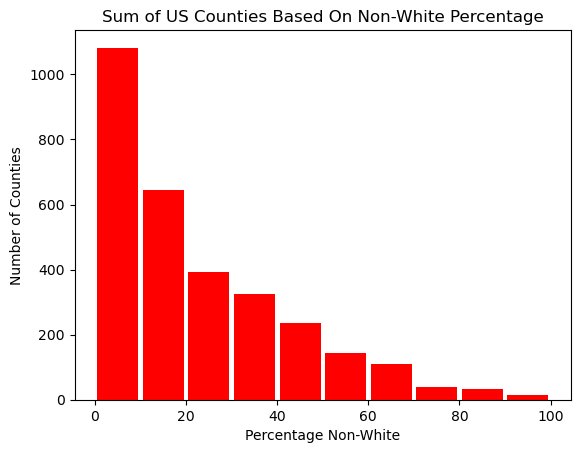

In [167]:
plt.hist(df["Percent Diverse"],10,range=[0,100],rwidth=0.9, color='red')
plt.title('Sum of US Counties Based On Non-White Percentage')
plt.ylabel('Number of Counties')
plt.xlabel('Percentage Non-White')

>The Sum of Percentage Non-White in US counties histogram sums the amount of counties and the respective percentage that is non-white. The histogram reveals that the majority of counties in the United States have less than 20% non-white population. This can then be used to find associations with voting outcomes and thus predictions about counties voting habits.

Text(0.5, 0, 'Death Rate per 10000')

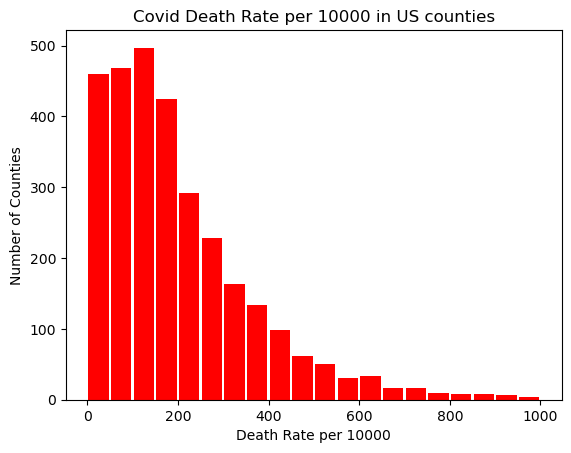

In [168]:
plt.hist(df["death"],20,range=[0,1000],rwidth=0.9, color = 'red')
plt.title('Covid Death Rate per 10000 in US counties')
plt.ylabel('Number of Counties')
plt.xlabel('Death Rate per 10000')

>COVID Death Rate per 10,000 in US counties shows how prevalant COVID-19 was on communities. The death rate is the proportion of deaths to cases multiplied by 10,000 and shows a positive skew in the data where the death rate was between 0 and 400 for the majority of counties. The COVID Death rate explains how for over 75% of counties had a death rate smaller than 300 per 10,000 or 0.03%. This graph helps us understand the lethality of COVID and its effect on voting outcome.

Text(0.5, 0, 'Percentage voting for Trump')

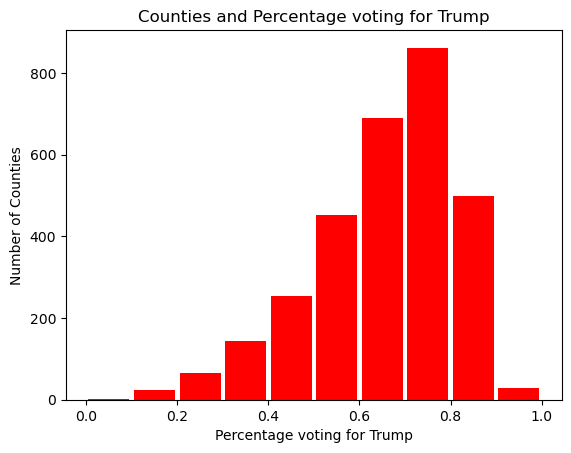

In [169]:
plt.hist(df["percentage20_Donald_Trump"],10,range=[0,1],rwidth=0.9, color = 'red')
plt.title('Counties and Percentage voting for Trump')
plt.ylabel('Number of Counties')
plt.xlabel('Percentage voting for Trump')

>Counties and Percentage voting for Trump shows the total number of counties given what proportion voted for Trump. This data is negatively skewed as lots of counties have a high proportion of people voting for Trump. This helps us understand that Trump won many low population counties as he lost the election. Trumps dominance of smaller, non-diverse, and lower income counties helps quantify the influence between the covariates and voting outcome. 

Text(0.5, 0, 'Percentage voting for Biden')

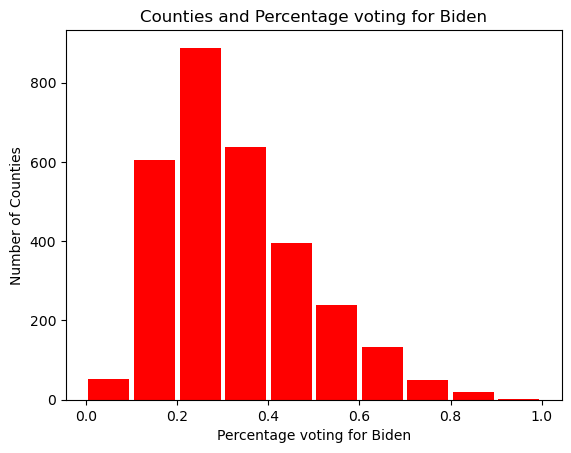

In [170]:
plt.hist(df["percentage20_Joe_Biden"],10,range=[0,1],rwidth=0.9, color = 'red')
plt.title('Counties and Percentage voting for Biden')
plt.ylabel('Number of Counties')
plt.xlabel('Percentage voting for Biden')

>Counties and Percentage voting for Biden shows the total number of counties given what proportion voted for Biden. This data is negatively skewed as lots of counties have a high proportion of people voting for Biden. This can be explained by Biden voters mainly being in cities with higher population density due to Biden winning with having less counties and county percentages voting for him. Biden having a more support in diverse, higher income, and larger population counties shows the relationship between attitudes towards COVID and voting for Biden.

Text(0.5, 0, 'Average Income in USD')

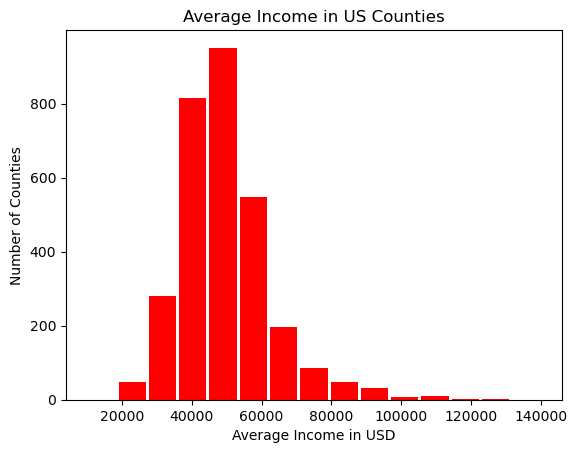

In [171]:
plt.hist(df["Income"],bins = 15,range=[10000,140000],rwidth=0.9, color = 'red')
plt.title('Average Income in US Counties')
plt.ylabel('Number of Counties')
plt.xlabel('Average Income in USD')

>Average Income in the US counties sums the amount of counties and their average income in USD. This shows us that income is slightly negatively skewed with a tail to the right. This shows how the income is unimodal around the $50,000. Average income will per county will be useful to decide how middle class voters will vote. 

Correlation: 0.527222612669713


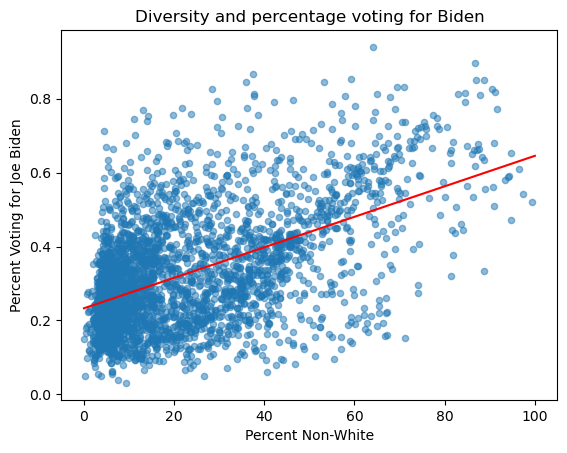

In [172]:
lr = LinearRegression()
lr.fit(df[['Percent Diverse']].values,df['percentage20_Joe_Biden'].values)
X = df['Percent Diverse'].values.reshape(-1,1)
Y = df['percentage20_Joe_Biden'].values.reshape(-1,1)
x = np.linspace(0,100, endpoint=True).reshape(-1,1)
y_pred = lr.predict(x)
ax = df.plot.scatter(x='Percent Diverse', y='percentage20_Joe_Biden', alpha=0.5)
ax.plot(x, y_pred, c='r')
ax.set_xlabel("Percent Non-White")
ax.set_ylabel("Percent Voting for Joe Biden")
ax.set_title('Diversity and percentage voting for Biden')
print('Correlation:', math.sqrt(lr.score(X,Y)))

>Diversity and Percentage Voting for Biden is a scatter plot that shows the relationship between Non-White voters and the proportion of the county that votes for Biden. This conveys that there is a strong positive relationship and that higher diversity counties have a higher proportion that voted for Biden. Demographic data has a strong influence on voting percentage for Biden and shows how correlated this traditional factor is to Biden's election victory. The correlation of 0.53 greatly supports the notion that diversity plays a large factor in voting. It is greater than the correlation of both income and COVID Deaths with voting percentage for Biden. This is not surprising as Biden's campaign policies supported social movements for minorities during 2020.

Correlation: 0.5138417044767698


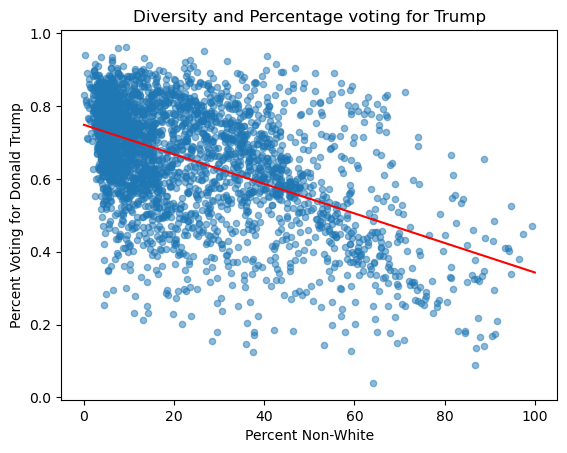

In [173]:
lr = LinearRegression()
lr.fit(df[['Percent Diverse']].values,df['percentage20_Donald_Trump'].values)
X = df['Percent Diverse'].values.reshape(-1,1)
Y = df['percentage20_Donald_Trump'].values.reshape(-1,1)
x = np.linspace(0,100, endpoint=True).reshape(-1,1)
y_pred = lr.predict(x)
ax = df.plot.scatter(x='Percent Diverse', y='percentage20_Donald_Trump', alpha=0.5)
ax.plot(x, y_pred, c='r')
ax.set_xlabel("Percent Non-White")
ax.set_ylabel("Percent Voting for Donald Trump")
ax.set_title('Diversity and Percentage voting for Trump')
print('Correlation:', math.sqrt(lr.score(X,Y)))

>Diversity and Percentage Voting for Trump is a scatter plot that shows the relationship between Non-White voters and the proportion of the county that votes for Trump. This conveys that there is a negative relationship and that higher diversity counties have a lower proportion that voted for Trump. Traditional factors like diversity of a county have a strong negative correlation with the percentage that voted for Trump in 2020. The correlation of 0.51 is stronger than the other covariates with Trump voting percentage. This is most likely due to Trump not being an avid supporter of the social movements for minorities that took place during 2020. He did not express campaign and policy support for social movements during his campaign. 

Correlation: 0.14769089333853386


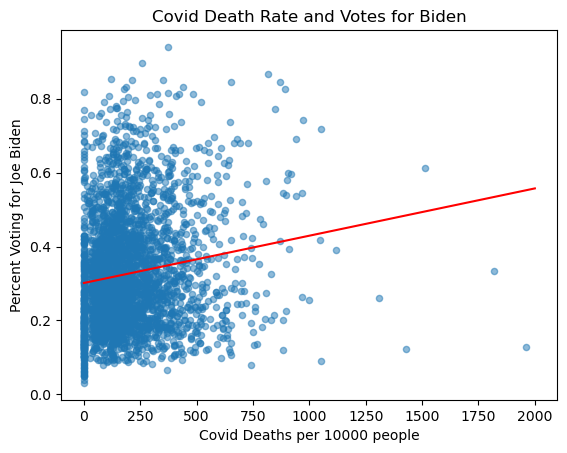

In [174]:
lr = LinearRegression()
lr.fit(df[['death']].values,df['percentage20_Joe_Biden'].values)
X = df['death'].values.reshape(-1,1)
Y = df['percentage20_Joe_Biden'].values.reshape(-1,1)
x = np.linspace(0,2000, endpoint=True).reshape(-1,1)
y_pred = lr.predict(x)
ax = df.plot.scatter(x='death', y='percentage20_Joe_Biden', alpha=0.5)
ax.plot(x, y_pred, c='r')
ax.set_xlabel("Covid Deaths per 10000 people")
ax.set_ylabel("Percent Voting for Joe Biden")
ax.set_title('Covid Death Rate and Votes for Biden')
print('Correlation:', math.sqrt(lr.score(X,Y)))

>Covid Death Rate and Votes for Biden shows the relationship between the proportion that had passed due to COVID in counties per 10,000 people and the percentage of the county that voted for Biden. The higher rate of deaths due to COVID shows a higher percentage voting for Biden. This relationship is positive and shows how voters were influenced by COVID policy. There is a slight relationship with a correlation of 0.15, however not as strong as the correlation between diversity and Biden vote percentage per county. This implies some influence on voting outcome due to COVID but not to the same extent as the other covariates.

Correlation: 0.13585544489740753


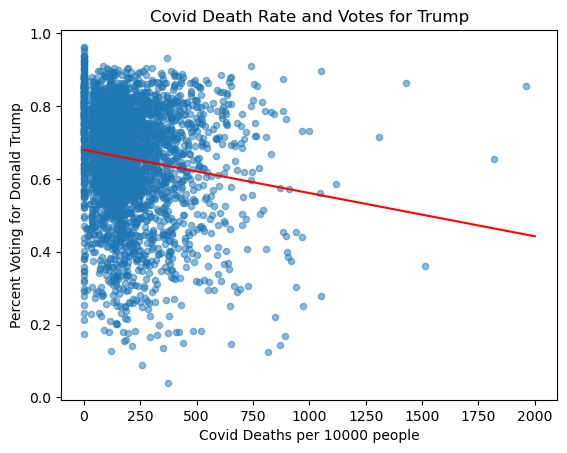

In [175]:
lr = LinearRegression()
lr.fit(df[['death']].values,df['percentage20_Donald_Trump'].values)
X = df['death'].values.reshape(-1,1)
Y = df['percentage20_Donald_Trump'].values.reshape(-1,1)
x = np.linspace(0,2000, endpoint=True).reshape(-1,1)
y_pred = lr.predict(x)
ax = df.plot.scatter(x='death', y='percentage20_Donald_Trump', alpha=0.5)
ax.plot(x, y_pred, c='r')
ax.set_xlabel("Covid Deaths per 10000 people")
ax.set_ylabel("Percent Voting for Donald Trump")
ax.set_title('Covid Death Rate and Votes for Trump')
print('Correlation:', math.sqrt(lr.score(X,Y)))

>Covid Death Rate and Votes for Trump shows the relationship between the proportion that had passed due to COVID in counties per 10,000 people and the percentage of the county that voted for Trump. The higher rate of deaths due to COVID shows a higher percentage voting for Trump. This relationship is negative and shows how voters were influenced by COVID policy. There is a slight relationship with a correlation of 0.14, however not as strong as the correlation between diversity and Biden vote percentage per county. This implies some influence on voting outcome due to COVID but not to the same extent as the other covariates.

Correlation: 0.22949312724617293


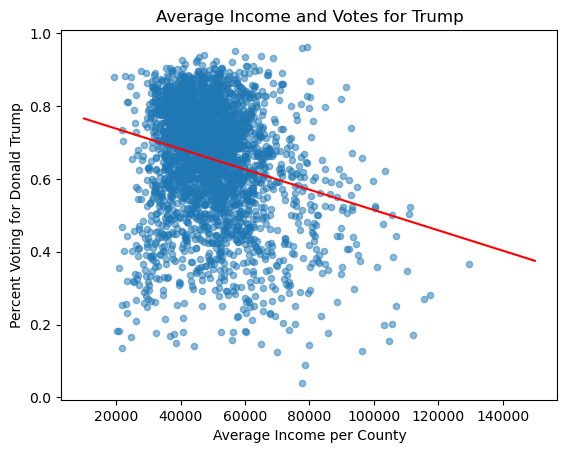

In [176]:
lr = LinearRegression()
lr.fit(df[['Income']].values,df['percentage20_Donald_Trump'].values)
X = df['Income'].values.reshape(-1,1)
Y = df['percentage20_Donald_Trump'].values.reshape(-1,1)
x = np.linspace(10000,150000, endpoint=True).reshape(-1,1)
y_pred = lr.predict(x)
ax = df.plot.scatter(x='Income', y='percentage20_Donald_Trump', alpha=0.5)
ax.plot(x, y_pred, c='r')
ax.set_xlabel("Average Income per County")
ax.set_ylabel("Percent Voting for Donald Trump")
ax.set_title('Average Income and Votes for Trump')
print('Correlation:', math.sqrt(lr.score(X,Y)))

>Average Income and Votes for Trump shows the relationship between average income in counties and votes for Trump. There is a negative relationship that shows how counties of average income tended to have a quite high percentage for Trump. There is a slight relationship with a correlation of 0.22, however not as strong as the correlation between diversity and Biden vote percentage per county but larger than the COVID Death rate. This implies some influence on voting by income.

Correlation: 0.21877838247103618


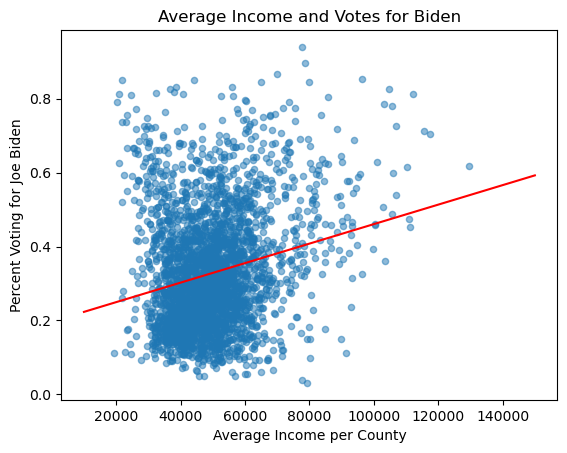

In [177]:
lr = LinearRegression()
lr.fit(df[['Income']].values,df['percentage20_Joe_Biden'].values)
X = df['Income'].values.reshape(-1,1)
Y = df['percentage20_Joe_Biden'].values.reshape(-1,1)
x = np.linspace(10000,150000, endpoint=True).reshape(-1,1)
y_pred = lr.predict(x)
ax = df.plot.scatter(x='Income', y='percentage20_Joe_Biden', alpha=0.5)
ax.plot(x, y_pred, c='r')
ax.set_xlabel("Average Income per County")
ax.set_ylabel("Percent Voting for Joe Biden")
ax.set_title('Average Income and Votes for Biden')
print('Correlation:', math.sqrt(lr.score(X,Y)))

>Average Income and Votes for Biden shows the relationship between average income in counties and votes for Biden. There is a positive relationship that shows how increasing the average income in counties increases the proportion that voted for Biden. There is a slight relationship with a correlation of 0.22, however not as strong as the correlation between diversity and Biden vote percentage per county. This implies some influence on voting outcome due to income which is larger than the COVID Death rate correlation.

# Project Two

## The Message

>This helps to show how there is a weaker correlation between COVID Death Rate and voting for Joe Biden. The Y axis is the amount of counties and the X is the amount voting for Joe Biden. There is a similar pattern between the X variables where higher death rate has less counties with a majority voting for Biden. This conveys the notion that COVID did not have as large of an influence on the election as previously thought. Reasons behind this could be that Joe Biden and Democratic governers inacted policies that helped limit the spread of COVID through lockdowns and restrictions where Trump and Republicans were lenient with COVID restrictions citing that COVID was not as lethal and wanting to avoid Economic impairment. This would influence voters as some believed the opportunity cost of staying in lockdowns was greater than mitigating COVID.

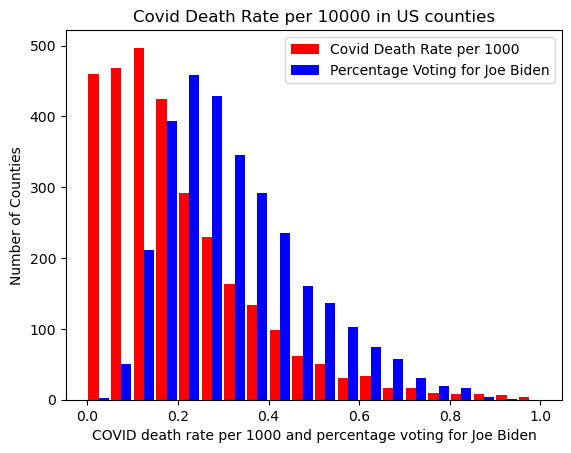

In [178]:
x = df['death']/1000
y = df['percentage20_Joe_Biden']
plt.hist([x,y],20,range=[0,1],rwidth=0.9, color = ['red','blue'], label=['Covid Death Rate per 1000', 'Percentage Voting for Joe Biden'])
plt.title('Covid Death Rate per 10000 in US counties')
plt.ylabel('Number of Counties')
plt.xlabel('COVID death rate per 1000 and percentage voting for Joe Biden')
plt.legend(loc='upper right')

## Maps and Interpretations

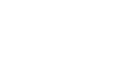

In [179]:
world = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
fig, gax = plt.subplots(figsize=(1,1))
fig.set_visible(False)
county_df = gpd.read_file("http://www2.census.gov/geo/tiger/GENZ2020/shp/cb_2020_us_county_5m.zip")
county_df['CovidDeathRate'] = df["CovidDeathRate"]
county_df.plot(ax=gax, edgecolor="black", color="white")
bokeh_df = county_df.copy()
bokeh_df.dropna()
bokeh_df['proportion_Trump']=df['percentage20_Donald_Trump']
bokeh_df['proportion_Biden']=df['percentage20_Joe_Biden']
bokeh_df['diversity']=100-df['White']
bokeh_df['pop']=df['TotalPop']
us_geojson=GeoJSONDataSource(geojson=bokeh_df.to_json())
color_mapper = LinearColorMapper(palette = brewer['RdBu'][10], low = 0, high = 5)
color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8,width = 500, height = 20,
                     border_line_color=None,location = (0,0), orientation = 'horizontal')
color_bar.title = 'Covid Deaths as a Percent of Total Cases'
hover = HoverTool(tooltips = [ ('County','@NAMELSAD'),('Portion Trump', '@proportion_Trump'),
                               ('Portion Biden','@proportion_Biden'),
                               ('Covid Death Rate','@CovidDeathRate'),('Diversity', '@diversity'),('Population', '@pop')])
p = figure(title="Mainland US COVID and Voting  in 2020 Presidential Election", tools=[hover],x_range=(-130,-65), y_range=(20,55),width=900)
p.patches("xs","ys",source=us_geojson,
          fill_color = {'field' :'CovidDeathRate', 'transform' : color_mapper})
p.add_layout(color_bar, 'below')
p.grid.visible = False
show(p)

>This map of the mainland United States shows the COVID death rate by county. It shows how cities and areas with higher population density had a higher number of deaths as a proportion of cases. This can be used for further analyses on statewide COVID analyses as most deaths seem to occur in the northeast and southern states where there is large population density. 

In [180]:
county_df = gpd.read_file("http://www2.census.gov/geo/tiger/GENZ2020/shp/cb_2020_us_county_5m.zip")
county_df = county_df.query("STATEFP == '12'")
county_df['CovidDeathRate'] = df["CovidDeathRate"]
county_df.plot(ax=gax, edgecolor="black", color="white")
bokeh_df = county_df.copy()
bokeh_df.dropna()
bokeh_df['proportion_Trump']=df['percentage20_Donald_Trump']
bokeh_df['proportion_Biden']=df['percentage20_Joe_Biden']
bokeh_df['diversity']=100-df['White']
bokeh_df['pop']=df['TotalPop']
fl_geojson=GeoJSONDataSource(geojson=bokeh_df.to_json())
color_mapper = LinearColorMapper(palette = brewer['RdBu'][10], low = 0, high = 5)
color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8,width = 500, height = 20,
                     border_line_color=None,location = (0,0), orientation = 'horizontal')
color_bar.title = 'Covid Deaths as a Percent of Total Cases'
hover = HoverTool(tooltips = [ ('County','@NAMELSAD'),('Portion Trump', '@proportion_Trump'),
                               ('Portion Biden','@proportion_Biden'),
                               ('Covid Death Rate','@CovidDeathRate'),('Diversity', '@diversity'),('Population', '@pop')])
p = figure(title="Florida Voting in 2020 Presidential Election", tools=[hover])
p.patches("xs","ys",source=fl_geojson,
          fill_color = {'field' :'CovidDeathRate', 'transform' : color_mapper})
p.add_layout(color_bar, 'below')
p.grid.visible = False
show(p)

<Figure size 640x480 with 0 Axes>

>This interactive map of Florida seeks to explore the outcome of election voting by county on an important swing state where Trump and Biden were contested especially one where COVID  was prevalent. The deeper red color of the county indicates a higher mortality rate. From this we can see that it agrees with previous linear regression analyses that there is some correlation with high COVID rate. As we can see most counties with over a 3.0 COVID death rate voted majority for Trump except for Orange and Broward county. This is most likely due to the lenient nature of COVID restrictions in Florida. The lockdowns did not go as long and were not as restrictive which would lead to Florida residents having a more lenient view of the pandemic which eventually pulled Florida into Trumps favor for the election result.  These counties have a higher percentage of non-white residents further supporting previous analyses. This associates how counties with cities typically had a higher COVID death rate, yet only higher Biden voting percentage when the county had a higher percentage non-white. This further supports the notion that COVID had some but not an immense influence on the 2020 election when compared to other factors. 

In [181]:
county_df = gpd.read_file("http://www2.census.gov/geo/tiger/GENZ2020/shp/cb_2020_us_county_5m.zip")
county_df = county_df.query("STATEFP == '13'")
county_df['CovidDeathRate'] = df["CovidDeathRate"]
county_df.plot(ax=gax, edgecolor="black", color="white")
bokeh_df = county_df.copy()
bokeh_df.dropna()
bokeh_df['proportion_Trump']=df['percentage20_Donald_Trump']
bokeh_df['proportion_Biden']=df['percentage20_Joe_Biden']
bokeh_df['diversity']=100-df['White']
bokeh_df['pop']=df['TotalPop']
ga_geojson=GeoJSONDataSource(geojson=bokeh_df.to_json())
color_mapper = LinearColorMapper(palette = brewer['RdBu'][10], low = 0, high = 5)
color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8,width = 500, height = 20,
                     border_line_color=None,location = (0,0), orientation = 'horizontal')
color_bar.title = 'Covid Deaths as a Percent of Total Cases'
hover = HoverTool(tooltips = [ ('County','@NAMELSAD'),('Portion Trump', '@proportion_Trump'),
                               ('Portion Biden','@proportion_Biden'),
                               ('Covid Death Rate','@CovidDeathRate'), ('Diversity', '@diversity'), ('Population', '@pop')])
p = figure(title="Georgia Voting in 2020 Presidential Election", tools=[hover])
p.patches("xs","ys",source=ga_geojson,
          fill_color = {'field' :'CovidDeathRate', 'transform' : color_mapper})
p.add_layout(color_bar, 'below')
p.grid.visible = False
show(p)

<Figure size 640x480 with 0 Axes>

>This interactive map of Georgia seeks to explore the outcome of election voting by county on an important swing state where Trump and Biden were contested especially one where COVID  was prevalent. The deeper red color of the county indicates a higher mortality rate. From this we can see that it agrees with previous linear regression analyses that there is some correlation with high COVID rate. This associates how counties with cities typically had a higher COVID death rate, yet only higher Biden voting percentage when the county had a higher percentage non-white. The county of Fannin had a death rate of 4.9% and a diversity of 43% with a Biden voting percentage of 0.523. This helps show how higher diveristy and covid deaths are associated with Biden voting and his platform in 2020. This further supports the notion that COVID had some but not an immense influence on the 2020 election when compared to other factors.

In [182]:
county_df = gpd.read_file("http://www2.census.gov/geo/tiger/GENZ2020/shp/cb_2020_us_county_5m.zip")
county_df = county_df.query("STATEFP == '42'")
county_df['CovidDeathRate'] = df["CovidDeathRate"]
county_df.plot(ax=gax, edgecolor="black", color="white")
bokeh_df = county_df.copy()
bokeh_df.dropna()
bokeh_df['proportion_Trump']=df['percentage20_Donald_Trump']
bokeh_df['proportion_Biden']=df['percentage20_Joe_Biden']
bokeh_df['diversity']=100-df['White']
bokeh_df['pop']=df['TotalPop']
pa_geojson=GeoJSONDataSource(geojson=bokeh_df.to_json())
color_mapper = LinearColorMapper(palette = brewer['RdBu'][10], low = 0, high = 5)
color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8,width = 500, height = 20,
                     border_line_color=None,location = (0,0), orientation = 'horizontal')
color_bar.title = 'Covid Deaths as a Percent of Total Cases'
hover = HoverTool(tooltips = [ ('County','@NAMELSAD'),('Portion Trump', '@proportion_Trump'),
                               ('Portion Biden','@proportion_Biden'),
                               ('Covid Death Rate','@CovidDeathRate'),('Diversity', '@diversity'),('Population', '@pop')])
p = figure(title="Pennsylvania Voting in 2020 Presidential Election", tools=[hover])
p.patches("xs","ys",source=pa_geojson,
          fill_color = {'field' :'CovidDeathRate', 'transform' : color_mapper})
p.grid.visible = False
p.add_layout(color_bar, 'below')
show(p)

<Figure size 640x480 with 0 Axes>

>This interactive map of Pennslyvania seeks to explore the outcome of election voting by county on an important swing state where Trump and Biden were contested especially one where COVID  was prevalent. The deeper red color of the county indicates a higher mortality rate. From this we can see that it agrees with previous linear regression analyses that there is some correlation with high COVID rate. This associates how counties with cities typically had a higher COVID death rate, yet only higher Biden voting percentage when the county had a higher percentage non-white. The county of Montgomery, which contains Philadelphia had a death rate of 8.145% and a diversity of 37.5% with a Biden voting percentage of 0.866. This helps show how higher diveristy and covid deaths are associated with Biden voting and his platform in 2020. This further supports the notion that COVID had some but not an immense influence on the 2020 election when compared to other factors.

# Project 3

## Potential Data To Scrape
> Potential data to scrape would be other factors that are commonly associated with voting outcome. The address that it will be scraped from is https://data.census.gov/table?q=us+education+by+county&y=2020&tid=ACSST5Y2020.S1501. Education influences how people vote in the United States. This data shows each county and the amount of people who have completed at least a four year bachelors degree by county and are over the age of 25. This data would enchance the analysis of the study as it would add an covariate to the analysis of the influence of COVID on the 2020 election. Merging into the dataset and dataframe as an additional column corresponding to their respective county. This information can be used for additional regression analyses in both simple and multiple regression as there is evidence to show that education is correlated with voting outcome for certain political parties. University graduates tend to lean towards voting for the Democratic candidate while those who have not completed a four year degree on average vote more for the Republican candidate It can also be used possibly for machine learning prediction taking into account this information to then predict the outcome of the election without COVID. Finding the regression analysis in both simple and multiple regression to determine COVID influence holding other variables constant that have a high correlation with voting outcome. Specifically during 2020 and the pandemic, there was lots of debate about the viral mechanics of COVID. Those with university degrees, especially anything life science or medicine related, could analyze all the correct and incorrect information during that time and based on their assessment of the severity of COVID, adjust their preference for a Trump or Biden based on the more lax stance of Trump or more concerned stance of Biden.

## Potential Challenges

> The potential challenges are working with the API and the amount of surveys and variables that the census covers. The US census API has 1330 datasets that are available to be scraped. The survey used for this analysis is the 2020 American Community Survey for the 2020 year. This survey has 18813 variables for many usages including demographics. In addition there is also challenges integrating the webscraped data set to the original data as there are excessive strings and words in the output. For example the original dataframe only had the county name, but the API return a dataframe with the word 'County' after all of them. To merge and utilize the data requires cleaning and modification. This data is not required to be run over a set period of time, as there are around 3000 counties in the United States and was easily retrieved. Future endeavours would require additonal insight into the

## Scraping Data From A Website

In [183]:
api_url = 'http://api.census.gov/data/2020/acs/acs5/subject?get=NAME,S1501_C02_015E&for=county:*&key=b7e436354eab245aeeb2986b3db36e5efbc358c1'
#This is the API url. The 'get=' specifies what variables to retrieve. This one retrieves county name and percentage of a county over 25 with at least a bachelors degree.
response = requests.get(api_url) #Gets the API response
j = response.json() #Converts to a JSON 
educ_df = pd.DataFrame(j) #Transform JSON data to pandas dataframe
educ_df = educ_df.drop(0)
educ_df = educ_df.reset_index()
educ_df.dropna() #Clean the newly acquired data 

,index,0,1,2,3
0,1,"Autauga County, Alabama",28.3,01,001
1,2,"Baldwin County, Alabama",31.9,01,003
2,3,"Barbour County, Alabama",11.6,01,005
3,4,"Bibb County, Alabama",11.3,01,007
4,5,"Blount County, Alabama",13.3,01,009
...,...,...,...,...,...
3216,3217,"Renville County, Minnesota",15.1,27,129
3217,3218,"Roseau County, Minnesota",19.0,27,135
3218,3219,"Sherburne County, Minnesota",25.7,27,141
3219,3220,"Steele County, Minnesota",26.8,27,147


> The process of scraping using the API starts with getting verified with a key. A key is required to access government data through an API. There is a list of different surveys for seperate time periods with their unique variables. This code will scrape the American Community Survey (5-year). Choosing from the list of variables yields the "NAME" variable for the counties, and "S1501_C02_015E", which is the proportion of a county with a bachelors degree and is over 25 years old. Using the 'get=' part of the URL and the key and then assign it to a variable with the requests library. This data is converted to a JSON and then to a dataframe. The education dataframe is then cleaned using .reset_index() and .dropna() to remove NaN or inf values.

## Merging The Scraped Dataset

In [197]:
educ_df.rename(columns = {0:'county', 1:'percent bachelors', 2:'state'}, inplace = True)
for column_name, column_data in educ_df.items(): #Iterate through dataframe
    if column_name == 'county': #Limit iteration to the name column
        ix = 0
        for value in column_data: #Modify county names
            temp = value.replace(' County', '') #Removes the names of the word 'County'
            temp = temp.split(',')[0] #Removes everything after the comma
            educ_df.loc[ix, 'county'] = temp #Modifies educ_df with new temp values
            ix+=1 #Increment index to next row        
state_df = pd.read_csv('Fips state codes.csv')
state_df['Fips'] = state_df['Fips'].astype(str)#These lines of code clean the values inside the FIPS column 
state_df['Fips'] = state_df['Fips'].str.lstrip('0')
educ_df['state'] = educ_df['state'].str.lstrip('0')
educ_df['stpost'] = pd.Series(dtype='object')#Convert to a series type to avoid TypeError
for index, row in educ_df.iterrows():#Loop through the 'state' column 
    if row['state'] in state_df['Fips'].values:#Make sure there is a valid state code
        idx = state_df.loc[state_df['Fips'] == row['state']].index[0]
        temp = state_df.loc[idx, 'State'] #Assign state postal code based on FIPS state code
        educ_df.loc[index, 'stpost'] = temp
new_df = pd.merge(left=df, right=educ_df, left_on=['county','state'], right_on=['county','stpost'], how='outer')#Merge to original dataframe
new_df['percent bachelors'] = pd.to_numeric(new_df['percent bachelors'], errors='coerce').apply(np.rint)
new_df['percent bachelors'] = new_df['percent bachelors'].round().astype('Int64')
new_df['percent bachelors'] = new_df['percent bachelors']/100 #Modify to help regression analysis
new_df['ln Income'] = np.log(new_df['Income'])
new_df.head()
#new_df has a total of 3289 observations

,Unnamed: 0,county,state_x,percentage16_Donald_Trump,percentage16_Hillary_Clinton,total_votes16,votes16_Donald_Trump,votes16_Hillary_Clinton,percentage20_Donald_Trump,percentage20_Joe_Biden,total_votes20,votes20_Donald_Trump,votes20_Joe_Biden,lat,long,cases,deaths,TotalPop,Men,Women,Hispanic,White,Black,Native,Asian,Pacific,VotingAgeCitizen,Income,IncomeErr,IncomePerCap,IncomePerCapErr,Poverty,ChildPoverty,Professional,Service,Office,Construction,Production,Drive,Carpool,Transit,Walk,OtherTransp,WorkAtHome,MeanCommute,Employed,PrivateWork,PublicWork,SelfEmployed,FamilyWork,Unemployment,index,percent bachelors,state_y,3,stpost,ln Income
0,0.0,Abbeville,SC,0.629,0.346,10724.0,6742.0,3712.0,0.661,0.330,12433.0,8215.0,4101.0,34.223334,-82.461707,805.0,17.0,24788.0,12044.0,12744.0,1.3,68.9,27.6,0.1,0.3,0.0,19452.0,35254.0,2259.0,19234.0,799.0,22.7,32.1,27.2,20.7,20.8,10.6,20.7,78.3,11.1,0.5,1.8,1.8,6.5,25.8,9505.0,78.8,13.3,7.8,0.1,9.4,2796.0,0.18,45,001,SC,10.470334
1,1.0,Acadia,LA,0.773,0.206,27386.0,21159.0,5638.0,0.795,0.191,28425.0,22596.0,5443.0,30.295065,-92.414197,3182.0,102.0,62607.0,30433.0,32174.0,2.4,77.5,17.6,0.1,0.1,0.0,45197.0,40492.0,2544.0,21591.0,1002.0,21.5,27.6,27.6,16.9,25.7,15.0,14.8,83.2,10.3,0.2,1.6,2.2,2.5,27.6,24982.0,80.0,12.1,7.6,0.3,8.9,NaN,<NA>,NaN,NaN,NaN,10.608860
2,2.0,Accomack,VA,0.545,0.428,15755.0,8582.0,6737.0,0.542,0.447,16938.0,9172.0,7578.0,37.767072,-75.632346,1227.0,19.0,32840.0,16079.0,16761.0,8.8,60.3,28.3,0.3,0.7,0.0,24408.0,42260.0,2253.0,24266.0,1564.0,19.8,31.8,31.1,17.7,18.8,15.1,17.3,80.0,10.6,0.5,2.6,1.8,4.5,22.0,13837.0,74.6,18.1,7.1,0.2,5.4,127.0,0.2,51,001,VA,10.651596
3,3.0,Ada,ID,0.479,0.387,195587.0,93748.0,75676.0,0.504,0.465,259389.0,130699.0,120539.0,43.452658,-116.241552,17451.0,181.0,435117.0,217999.0,217118.0,7.9,85.2,1.2,0.4,2.6,0.1,316189.0,60151.0,1294.0,31642.0,725.0,11.8,13.1,43.0,16.6,25.0,6.9,8.4,80.7,7.7,0.5,1.5,2.8,6.9,20.4,214984.0,78.3,15.0,6.6,0.1,4.3,1386.0,0.4,16,001,ID,11.004613
4,4.0,Adair,IA,0.653,0.300,3759.0,2456.0,1127.0,0.697,0.286,4183.0,2917.0,1197.0,41.330756,-94.471059,222.0,1.0,7192.0,3552.0,3640.0,1.7,96.6,0.3,0.0,0.4,0.0,5572.0,49477.0,2633.0,28861.0,2055.0,9.5,12.1,28.2,16.9,20.0,17.3,17.6,77.9,12.4,0.3,2.8,0.4,6.2,22.3,3680.0,73.8,15.3,10.4,0.5,3.0,2677.0,0.2,19,001,IA,10.809263


## Visualizing The Scraped Dataset

([<matplotlib.axis.XTick at 0x7fe6432fda20>,
 [Text(0.0, 0, '0'),
  Text(0.1, 0, '.10'),
  Text(0.2, 0, '.20'),
  Text(0.3, 0, '.30'),
  Text(0.4, 0, '.40'),
  Text(0.5, 0, '.50'),
  Text(0.6, 0, '.60'),
  Text(0.7, 0, '.70'),
  Text(0.8, 0, '.80'),
  Text(0.9, 0, '.90'),
  Text(1.0, 0, '.100')])

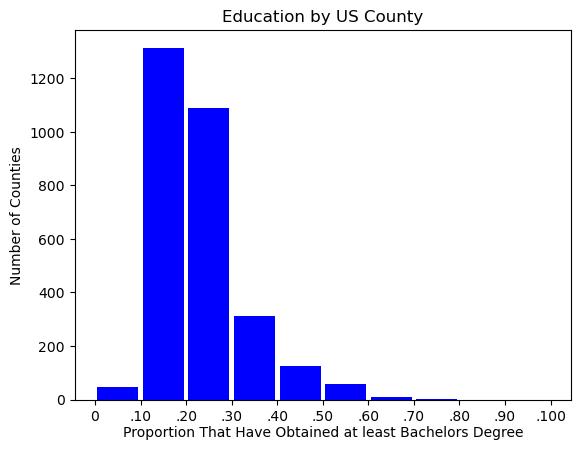

In [185]:
new_df = new_df.dropna()
plt.hist(new_df["percent bachelors"],10,range=[0,1],rwidth=0.9, color='blue')
plt.title('Education by US County')
plt.ylabel('Number of Counties')
plt.xlabel('Proportion That Have Obtained at least Bachelors Degree', labelpad=2)
ticks = [0, .10, .20, .30, .40, .50,.60,.70,.80,.90, 1]
labels = ['0', '.10', '.20', '.30', '.40', '.50','.60','.70','.80','.90','.100']
plt.xticks(ticks, labels)

> This histogram shows the cumulative education of counties in the United States. It shows how the majority of the counties in the United States are between 0.1 and 0.3 of the population over 25 having at least a bachelors degree. This is significant to the analysis as educated citizens are more likely to vote and be informed. This will help us understand the average county and its effect on voting. Merging this data will help assess the effect that COVID had on the 2020 election, as currently other traditional factors such as diveristy, have a much higher correlation with voting outcome than COVID. The more variables that get added to the analysis helps discern the effect of COVID when compared to the previously discussed factors. 

Correlation: 0.5239240144177898


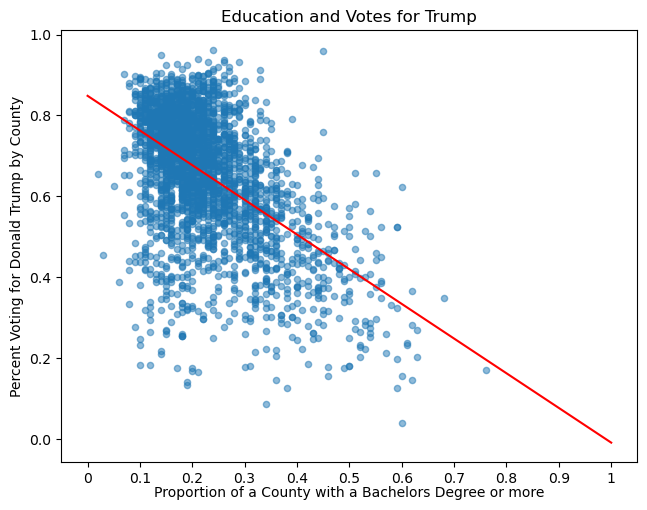

In [186]:
new_df = new_df.dropna()
lr = LinearRegression()
lr.fit(new_df[['percent bachelors']].values,new_df['percentage20_Donald_Trump'].values)
X = new_df['percent bachelors'].values.reshape(-1,1)
Y = new_df['percentage20_Donald_Trump'].values.reshape(-1,1)
x = np.linspace(0,1,2, endpoint=True).reshape(-1,1)
y_pred = lr.predict(x)
ax = new_df.plot.scatter(x='percent bachelors', y='percentage20_Donald_Trump', alpha=0.5)
ax.plot(x, y_pred, c='r')
ax.set_ylabel("Percent Voting for Donald Trump by County")
ax.set_title('Education and Votes for Trump')
plt.xlabel('Proportion of a County with a Bachelors Degree or more', labelpad=0)
ticks = [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]
labels = ['0','0.1','0.2','0.3','0.4','0.5','0.6','0.7','0.8','0.9','1']
plt.xticks(ticks, labels)
plt.subplots_adjust(left=0.05, right=0.95, bottom=0.05, top=0.95)
print('Correlation:', math.sqrt(lr.score(X,Y)))

> In this regression analysis between education and votes per county for Trump yields a significant negative correlation of 0.52. This is a strong correlation where the more educated a county was, the less they voted for Donald Trump. This is significant to our analysis as the correlation of education and voting outcome is greater than between COVID and voting outcome. This shows that most traditional factors, like diversity and education, played a bigger role in the 2020 election than COVID did, despite it being a major issue. This is most likely due to the nature that education plays with COVID, as most educated people understood the risks of COVID and therefore voted less on average for Trump as his attitude and policies were much more lenient. This further supports the notion that COVID had a marginal effect on the election.  

Correlation: 0.5128970322656684


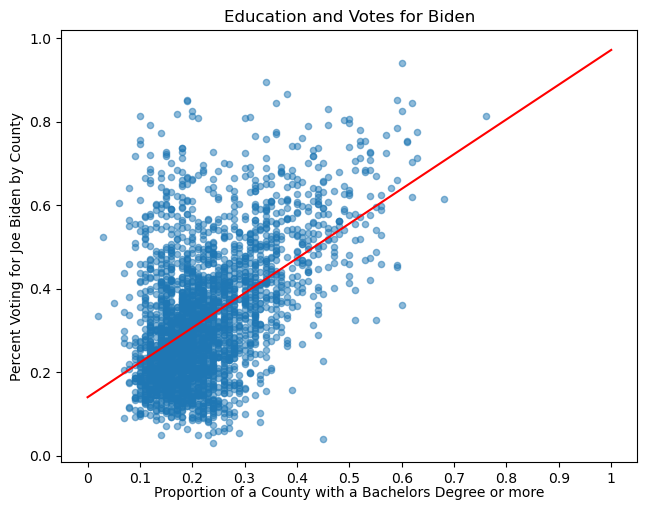

In [187]:
new_df = new_df.dropna()
lr = LinearRegression()
lr.fit(new_df[['percent bachelors']].values,new_df['percentage20_Joe_Biden'].values)
X = new_df['percent bachelors'].values.reshape(-1,1)
Y = new_df['percentage20_Joe_Biden'].values.reshape(-1,1)
x = np.linspace(0,1,2, endpoint=True).reshape(-1,1)
y_pred = lr.predict(x)
ax = new_df.plot.scatter(x='percent bachelors', y='percentage20_Joe_Biden', alpha=0.5)
ax.plot(x, y_pred, c='r')
ax.set_ylabel("Percent Voting for Joe Biden by County")
ax.set_title('Education and Votes for Biden')
plt.xlabel('Proportion of a County with a Bachelors Degree or more', labelpad=0)
ticks = [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]
labels = ['0','0.1','0.2','0.3','0.4','0.5','0.6','0.7','0.8','0.9','1']
plt.xticks(ticks, labels)
plt.subplots_adjust(left=0.05, right=0.95, bottom=0.05, top=0.95)
print('Correlation:', math.sqrt(lr.score(X,Y)))

> In this regression analysis between education and votes per county for Biden yields a significant positive correlation of 0.51. This is a strong correlation where the more educated a county was, the less they voted for Donald Trump. This is significant to our analysis as the correlation of education and voting outcome is greater than between COVID and voting outcome. This shows that most traditional factors, like diversity and education, played a bigger role in the 2020 election than COVID did, despite it being a major issue. This is most likely due to the nature that education plays with COVID, as most educated people understood the risks of COVID and therefore voted more on average for Biden as his attitude and policies were much more cautious about the dangers of COVID. This further supports the notion that COVID had a marginal effect on the election. 

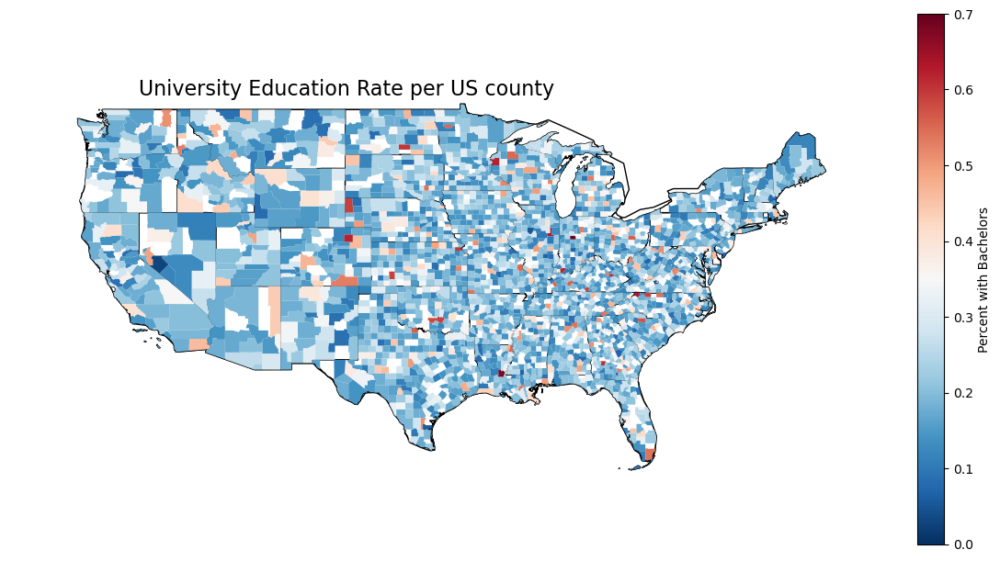

In [188]:
#Plots United States
world = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
fig, gax = plt.subplots(figsize=(15,15))
county_df = gpd.read_file("http://www2.census.gov/geo/tiger/GENZ2016/shp/cb_2016_us_county_5m.zip")
world.query("name == 'United States of America'").plot(ax = gax, edgecolor='black', color='white')
plt.xlim([-130,-64]) #Limit Bounds to mainland United States
plt.ylim([20,55])
plt.axis('Off')
state_df = gpd.read_file("http://www2.census.gov/geo/tiger/GENZ2020/shp/cb_2020_us_state_5m.zip")
#Clean and Modify Data
df = pd.read_csv("county_statistics.csv", on_bad_lines='skip')
df["CovidDeathRate"] = df['deaths']/df['cases'] *100 #Percentage of cases that are fatal
df["Coordinates"] = list(zip(df.long, df.lat))
df["Coordinates"] = df["Coordinates"].apply(Point)
df.dropna()
#Create GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry="Coordinates")
gdf['Coordinates'] = county_df['geometry']
gdf['educ'] = new_df['percent bachelors']
gdf = gdf.dropna()
gdf['educ'] = gdf['educ'].astype(float)
#Plot Counties
gax.annotate('University Education Rate per US county',xy=(-120, 50),  xycoords='data', fontsize=16)
def deathPlotting(gdf, col, gax, max, min, size):
    gdf.plot(ax=gax, cmap='RdBu_r', alpha = 1, column=col ,markersize=size, vmax=max, vmin=min, legend=True, legend_kwds ={'shrink':0.5,'label': 'Percent with Bachelors'}) 
state_df.plot(ax=gax, edgecolor='black', color='white')
deathPlotting(gdf, 'educ', gax, 0.7, 0, 1) 


> This map of the United States shows the education attainment of at least a bachelors degree for every county. The upper limits of the data is 70% so the map can be more informative. The cities tend to be the most educated, when compared to the country side. This is signifcant to our analysis as now there is evidence that shows that educated people end up settling in cities, and that educated voters in 2020 had a strong correlation with voting for Biden. In addition according to previous analysis of the COVID cases by county, it shows that cities where COVID was much more severe also might have influenced albeit marginally, their voting preferences.

## Adding a New Dataset

Text(0.5, 0, 'Median Age')

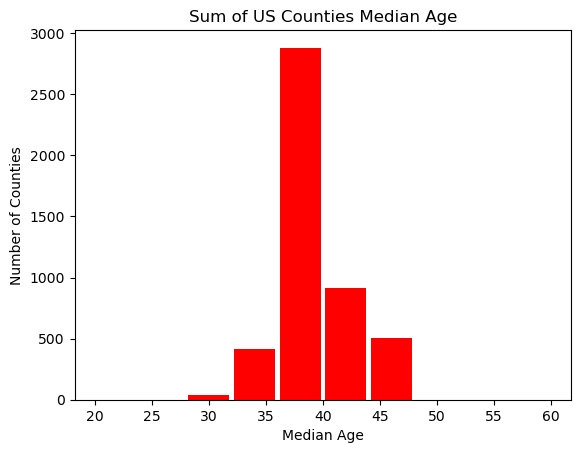

In [189]:
age = pd.read_csv('agestate.csv')
df = pd.merge(df, age,how='outer', on='state')
plt.hist(df["medianage"],10,range=[20,60],rwidth=0.9, color='red')
plt.title('Sum of US Counties Median Age')
plt.ylabel('Number of Counties')
plt.xlabel('Median Age')

> Using data from the US census data:https://data.census.gov/table?q=average+age+by+county+&g=010XX00US$0400000&y=2020&tid=ACSDP5Y2020.DP05&moe=false&tp=false , this analysis shows the sum of median age by county in the United States. This is useful for the analysis as there are drastic political differences based on age and generation. During 2020, there was an extra push to get young people to vote and so median age by county can help show the correlation between age and voting outcome. Generational differences are a large motivator behind voting preferences as typically, those who are older hold more conservative and traditional views while the youth tend to be more progressive. In practice, the United States election tends to have only the Republican and Democratic party being able to contest an election while third parties are typically underrepresented and receive a minority of the votes. The Republican party tends to lean more conservatively while the Democratic party is more progressive, which leads to generational differences and people vote on which party they identify with the greatest. Due to a seemily binary choice in US elections, age differences can have a significant effect on the outcome of elections.

# Final Project

## Economic Relationship between Election Outcome COVID

> The relationship between COVID and Election outcome has a linear relationship in previous analyses. We had found that there is a marginal effect that COVID had on the election through a simple regression and with a correlation for both Biden and Trump being 0.14 and 0.13 respectively. Economic theories can help explain the relationship between COVID and the election outcome. Elections can be considered extensive games that can be explained by game theory. In the United States, it is a simple game with two players, however the games are sequential in the sense that candidates race to  states, cities, and demographics to hold their rallies. The game includes support for different policies and strategies could be referring to the campaign promises and issues that candidates are willing to undertake with the payoff being votes. For example, issues surrounding police brutality and racial issues grew in early 2020 which prompted Joe Biden to emphasize for the movements and promised reform to these issues while Donald Trump denounced them. The payoffs for their strategies were increasing support in certain regions of the United States. Another example would be with COVID as typically the Republican party and supporters reject government intervention, Donald Trump avoided shutdown policies for COVID with the payoff being support from those who believed the opportunity cost of staying shut down was greater than preventing the spread of COVID. Previous analyses concluded that those who typically voted Republican were less diverse areas.

> These X variables were chosen as they would influence the payoffs of each candidate in a two party election. Racial and ethnic identity, income, education, and the COVID death rate all change the payoffs that a candidate chose as their strategy such as positions on COVID policy, support for social movements, and education. For example during his campaign Biden established his support for policies that would reduce student loans. This would help describe how those who are educated at a university level would shift their preferences to Biden. 

## Regressions for Joe Biden

In [190]:
new_df.dropna() #Clean dataframe
info_dict = {'R-squared': lambda x: f"{x.rsquared:.2f}",
             'No. observations': lambda x: f"{int(x.nobs):d}",
             'F-statistic': lambda x: f"{x.fvalue:.2f}"}
new_df['const'] = 1 #Constant
new_df['const'] = new_df['const'].astype(float) #Change type to avoid typerror
new_df['percent bachelors'] = new_df['percent bachelors'].astype(float)*100 #Modify dataframe to keep consistency
new_df['percentage20_Joe_Biden'] = new_df['percentage20_Joe_Biden']*100
X1 = ['const', 'CovidDeathRate', 'percent bachelors'] #Declare variables for analysis
X2 = ['const', 'CovidDeathRate', 'percent bachelors', 'Percent Diverse']
X3 = ['const','CovidDeathRate', 'percent bachelors', 'White', 'Black','Native','Asian','Pacific']
X4 = ['const','CovidDeathRate', 'percent bachelors', 'White', 'Black','Native','Asian','Pacific','ln Income']
reg1 = sm.OLS(new_df['percentage20_Joe_Biden'], new_df[X1], missing='drop').fit() #Run regressions for all sets of X variables
reg2 = sm.OLS(new_df['percentage20_Joe_Biden'], new_df[X2], missing='drop').fit()
reg3 = sm.OLS(new_df['percentage20_Joe_Biden'], new_df[X3], missing='drop').fit()
reg4 = sm.OLS(new_df['percentage20_Joe_Biden'], new_df[X4], missing='drop').fit()
results_table = summary_col(results=[reg1,reg2,reg3,reg4],
                            float_format='%0.2f',
                            stars = True,
                            model_names=['Model 1',
                                         'Model 2',
                                         'Model 3','Model 4'],
                            info_dict=info_dict,
                            regressor_order=['const',
                                             'CovidDeathRate',
                                             'percent bachelors',
                                             'Percent Diverse','White','Black', 'Native', 'Asian', 'Pacific', 'ln Income']) #Create regression summary table

results_table

,Model 1,Model 2,Model 3,Model 4
const,10.89***,3.44***,26.60***,78.33***
,(0.68),(0.57),(1.26),(11.03)
CovidDeathRate,1.44***,0.39***,0.15,0.17
,(0.13),(0.11),(0.10),(0.10)
percent bachelors,0.84***,0.85***,0.80***,0.87***
,(0.03),(0.02),(0.02),(0.03)
Percent Diverse,,0.41***,,
,,(0.01),,
White,,,-0.21***,-0.21***
,,,(0.01),(0.01)


> This multiple regression that analyzes the covariates that are associated with voting outcome. Diversity has been divided to the racial categories to increase the predictive value of the model as cultural differences manifest in politics and certain groups may be swayed by candidates to a differing degree. The model also contains the COVID death rate, income, and education. It starts out with a simple model with the combined education, and the death rate. The model has an extremely large f-statistic of 605, which indicates that the entire model with the two covariates is an excellent predictor for voting outcome, however a low adjusted R-squared of 0.29 indicates otherwise. Education and COVID death rate both are statistically significant at a one percent level. This means holding education constant, the effect of COVID on voting outcome was not by chance but a significant predictor. The economic significance of this first regression is to test how education and COVID interact with voting outcome for Biden. A one percent change in Covid death rate per county is associated with a 1.44 percent change in voting outcome, which is relatively large when compared to education. As the model is extended to include multiple races and the natural log of income to the final multiple regression, model four. Model four is extremely statistically significant with an f-statistic of 594 and an adjusted R-squared of 0.616. As the model is extended to include more covariates such as race, the log of income, and education, COVID death rate loses its statistical significance at any reputable level while the other variables are significant at a one percent level. This means that Covid death rate does not have a significant effect on voting outcome for Joe Biden holding income, education, and race constant and is not contributing to the model to the degree as other variables are. This helps quanitfy an answer to the effect that COVID had on the election. It is possible to conclude that there was not a statistically significant relationship between COVID and the 2020 election when compared to traditional factors such as income, race, and education. This will be the preferred regression for comparison for the Machine Learning analysis as Joe Biden ended up winning the presidential election.

## Regressions for Trump

In [191]:
new_df.dropna() #Clean dataframe
info_dict = {'R-squared': lambda x: f"{x.rsquared:.2f}",
             'No. observations': lambda x: f"{int(x.nobs):d}",
             'F-statistic': lambda x: f"{x.fvalue:.2f}"}

new_df['const'] = 1 #Add constant for y-intercept
new_df['const'] = new_df['const'].astype(float) #Convert to constant to avoid type error
new_df['percentage20_Donald_Trump'] = new_df['percentage20_Donald_Trump']*100 #Move decimal places to interpret results better
X1 = ['const', 'CovidDeathRate', 'percent bachelors'] #Declare X variables for all regressions
X2 = ['const', 'CovidDeathRate', 'percent bachelors', 'Percent Diverse']
X3 = ['const','CovidDeathRate', 'percent bachelors', 'White', 'Black','Native','Asian','Pacific']
X4 = ['const','CovidDeathRate', 'percent bachelors', 'White', 'Black','Native','Asian','Pacific','ln Income']
reg1 = sm.OLS(new_df['percentage20_Donald_Trump'], new_df[X1], missing='drop').fit() #Compute regressions for all variables
reg2 = sm.OLS(new_df['percentage20_Donald_Trump'], new_df[X2], missing='drop').fit()
reg3 = sm.OLS(new_df['percentage20_Donald_Trump'], new_df[X3], missing='drop').fit()
reg4 = sm.OLS(new_df['percentage20_Donald_Trump'], new_df[X4], missing='drop').fit()
results_table = summary_col(results=[reg1,reg2,reg3,reg4], #Create table for regression results
                            float_format='%0.2f', #Format results of numbers
                            stars = True, #For statistical significance
                            model_names=['Model 1', 
                                         'Model 2',
                                         'Model 3','Model 4'],
                            info_dict=info_dict,
                            regressor_order=['const',
                                             'CovidDeathRate',
                                             'percent bachelors',
                                             'Percent Diverse','White','Black', 'Native', 'Asian', 'Pacific', 'ln Income']) #List order of covariates


results_table

,Model 1,Model 2,Model 3,Model 4
const,87.75***,95.10***,72.36***,22.14**
,(0.68),(0.57),(1.28),(11.21)
CovidDeathRate,-1.35***,-0.31***,-0.09,-0.11
,(0.13),(0.11),(0.11),(0.10)
percent bachelors,-0.87***,-0.88***,-0.82***,-0.89***
,(0.03),(0.02),(0.02),(0.03)
Percent Diverse,,-0.41***,,
,,(0.01),,
White,,,0.21***,0.21***
,,,(0.01),(0.01)


> This multiple regression analyzes the covariates and their effect on county voting outcome for Trump. As discussed in the previous table for Biden, race has been divided to improve the predictive validity of the model. The first model that uses COVID death rate and education which shows a negative relationship for between voting for Trump and the covariates. In model one both education and death rate are highly statistically significant at a one percent level to voting outcome for Trump. Model one as a whole has a great statistical significance as the f-statistic is extremely large at 628, however the adjusted R-squared is low at 0.298 which diminishes the validity of the covariates explaining voting outcome. There is significant economic significance as a percentage increase in COVID death rate is associated with a 1.35 percent decrease in a voting for Trump holding education constant. Models two and three were included to show how adding more covariates makes COVID statistically insignifcant. The fourth and final model, which includes education, multiple races, income, and the COVID death rate. All covariates are statistically significant at a one percent level in model four except for COVID, which means that the statistically signifcant variable's relationship with the outcome is not due to chance. The final model is highly statistically significant with an f-statistic of 577 and an adjusted R-squared of 0.61. There is economic significance for all these variables as they all have a sizable effect on the outcome variable. The smallest effect is the percentage white of a county, which changes the voting outcome by 0.209 percent. This reinforces our discovery of the effect that COVID had on the 2020 election, which is that it did not have a significant effect when compared to traditional factors like income, education, and race.

## Machine Learning

## Regularization Parameters

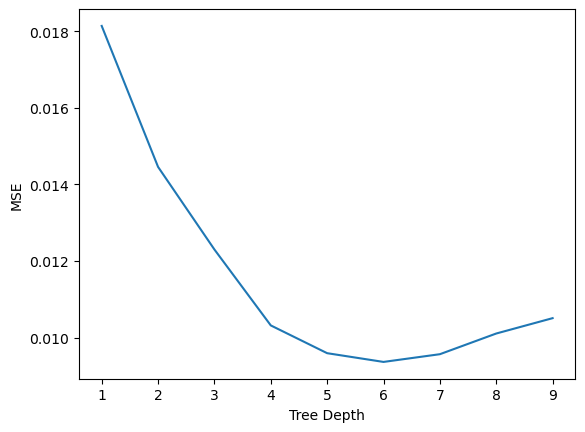

In [192]:
y = new_df['percentage20_Joe_Biden']/100
X = new_df.drop([3,'Percent Diverse','stpost','index','death','state_x','state_y','Unnamed: 0','county','percentage16_Donald_Trump','percentage16_Hillary_Clinton','total_votes16','votes16_Donald_Trump','votes16_Hillary_Clinton','percentage20_Donald_Trump','percentage20_Joe_Biden','total_votes20','votes20_Donald_Trump','votes20_Joe_Biden','lat','long','cases','deaths','TotalPop','Men','Women','VotingAgeCitizen','Income','IncomeErr','IncomePerCap','IncomePerCapErr','Poverty','ChildPoverty','Professional','Service','Office','Construction','Production','Drive','Carpool','Transit','Walk','OtherTransp','WorkAtHome','MeanCommute','Employed','PrivateWork','PublicWork','SelfEmployed','FamilyWork','Unemployment'],axis=1).copy()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42) #Split data into training data
max_dep = range(1,10) #Set max tree depth to test
crossval = [] #List to append cross validation scores
for depth in max_dep: #Loop through tree depths
    tree = DecisionTreeRegressor(max_depth=depth) 
    scores = cross_val_score(tree, X_train, y_train, cv=5, scoring='neg_mean_squared_error') #Calculate cross validation score
    crossval.append(-np.mean(scores)) #Append scores to list
plt.plot(max_dep, crossval) #Plot MSE and Depth
plt.xlabel('Tree Depth')
plt.ylabel('MSE')
plt.show()


> This plot shows the optimal length for the Joe Biden regression tree. It is non-monotonic and if extended further, a U-shaped pattern with the minimum being at a length of six. Changing the length changes the mean squared error, the terminal nodes, the branches, and the leaves. While the optimal length is six, to prevent overfitting the regression tree for Joe Biden will have a length of three to avoid overfitting and improve readability. The tree length is the most important regularization parameter in this analysis.

## Regression Tree for Joe Biden

MSE: 0.011710559254157323


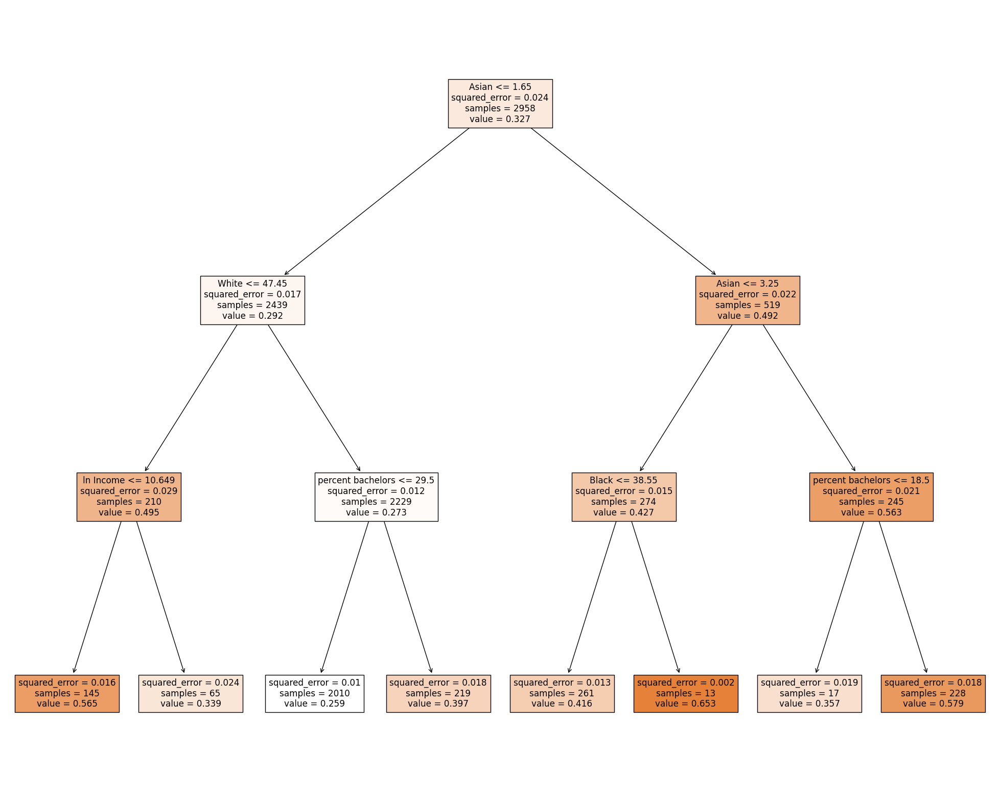

In [196]:
y = new_df['percentage20_Joe_Biden']/100
X = new_df.drop([3,'Percent Diverse','stpost','index','death','state_x','state_y','Unnamed: 0','county','percentage16_Donald_Trump','percentage16_Hillary_Clinton','total_votes16','votes16_Donald_Trump','votes16_Hillary_Clinton','percentage20_Donald_Trump','percentage20_Joe_Biden','total_votes20','votes20_Donald_Trump','votes20_Joe_Biden','lat','long','cases','deaths','TotalPop','Men','Women','VotingAgeCitizen','Income','IncomeErr','IncomePerCap','IncomePerCapErr','Poverty','ChildPoverty','Professional','Service','Office','Construction','Production','Drive','Carpool','Transit','Walk','OtherTransp','WorkAtHome','MeanCommute','Employed','PrivateWork','PublicWork','SelfEmployed','FamilyWork','Unemployment'],axis=1).copy()
biden_tree = tree.DecisionTreeRegressor(max_depth=3).fit(X,y)
y_pred_tree = biden_tree.predict(X)
tree_plot = plt.figure(figsize=(25,20))
tree_plot = tree.plot_tree(biden_tree,feature_names=X.columns,filled=True)
print('MSE:', metrics.mean_squared_error(y,y_pred_tree))

> The results of this regression tree show that the root is the percentage of a county that is Asian. According to the model, the larger amount of Asians results in higher voting outcome for Biden. Interpreting the left side of the tree, if the population is less than 47.45% white, then their income influences their voting preferences. This is most likely due to a majority of counties in the United States having a large only white population. If the population is greater than 47.45% white then the education proportion being over or under 29.5% matters for whether more of a county votes for Biden or not. On the right branch of the root, the percentage of a county being Asian occurs in the internal node again. It then branches out to factor in Black percentage and education where it leads to leaves. Interpreting this result shows how important race was in the 2020 election. Minorities tended to vote for Biden to a greater degree than majority white counties. If a county is majority white then their education and income are sub factors that determine their preference for Biden. If there is a larger Asian community then the presence of other minorities and education are additional subfactors for determining voting preference for Biden. The mean squared error of the entire tree is 0.01, and is reasonably low. Given that the dataset works in proportions, this is a small MSE and the model can be considered accurate. This helps answer our research question as the COVID death rate is not present in the model and is not an important assessor of voting outcome for Joe Biden.

> The regression tree yields an extension to the multiple regression analysis. It allows us to see which variables are most important to the determining the outcome of a county that voted for Biden. It shows that the composition of race in a county is the most important covariate. The main race that is factored into the result is the proportion Asian while the first depth internal nodes take into account how large the Asian population is and the county composition with other races before assessing other covariates such as income or education. While a regression assesses which variables are statistically significant, regression trees can order these variables in importance when they are all statistically significant at the same level. The regression tree also allows the reader to associate certain covariates with each other and assess their relationship visually. Each predictor space at the leaves of the tree as the result of these variables interacting and average income of the observations in the region. For example, without the tree regression we would not see how the race variables interact, as the regression only outputs the significance of each race to the outcome, however we understand how the racial composition influences a county and then other subfactors like income and education to fully develop a model for Biden's voting outcome.

## Conclusion
>The takeaway from the analysis of the dataset is that there are many relationships between the prevalance of COVID and the voting majority in United States counties. Counties with a higher COVID death rate had a strong positive relationship with higher proportion voting for Biden and the opposite being true for Trump. Policy positions on COVID-19 and campaign promises must have had a large influence on voter outcomes. Additionally, the higher diversity of counties is associated with higher Biden proportion and the opposite being true for Trump. This helps quantify the relationship between the social movements of 2020 with the effect on election outcome. Income also had an association with voting preferences as higher income per county was negatively associated with Trump votes. This can show the preferences of the middle class in the United States vote, as they contain the majority of people. Education was shown to have a strong correlation with voting outcome for both Trump and Biden, was positive for Biden. This is most likely due to educated people understanding policies and research to a greater degree as well as the potential danger of COVID. Using the webscraped data from the API, the analysis was extended to include median age per county and its effect on the outcome of the election. Utilizing multivariate regression to include covariates such as subgroups of race, income, education, and COVID death rate, the extended model showed how COVID was not a statistically significant variable towards the voting outcome per county for Trump or Biden while the other variables were significant at a one percent level. This showed how COVID did not have much influence on the 2020 election. In addition, using a regression tree showed that race was the most important factor, specifically Asian, and the county composition with other races. Other subfactors such as education and income played an important role however COVID was not found to be significant for the regression tree analysis and subsequently demonstrating how COVID had a negligible effect on the 2020 election.

>Areas of future research could include breaking down the diversity by different racial groups to show which was influenced the most by the social movements of 2020. Additionally, there could be a comparison of voting preferences in 2016 and 2020 to determine the influence of social movements due to the change in voting preference. It is possible to use regression trees to include more sociological factors that determine voting status, such as men versus women or by specific generation such as millenial, baby boomer, and generation z. 

## References
> De Lellis, P., Ruiz Marín, M. & Porfiri, M. Quantifying the role of the COVID-19 pandemic in the 2020 U.S. presidential elections. Eur. Phys. J. Spec. Top. 231, 1635–1643 (2022). https://doi.org/10.1140/epjs/s11734-021-00299-3

> Baccini, L., Brodeur, A. & Weymouth, S. The COVID-19 pandemic and the 2020 US presidential election. J Popul Econ 34, 739–767 (2021). https://doi.org/10.1007/s00148-020-00820-3